In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install -q roboflow ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 2.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 33.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 90.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
key = user_secrets.get_secret("roboflow_api_key")


In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key =key)
project = rf.workspace("bottledetection-raqqs").project("bottle-and-can-detection-v2")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Bottle-and-Can-Detection-v2-1 in yolov8:: 100%|██████████| 37214/37214 [00:05<00:00, 7055.12it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
from roboflow import Roboflow
import os
import shutil
import random


dataset_path = dataset.location


In [6]:
dataset_path

'/kaggle/working/Bottle-and-Can-Detection-v2-1'

In [7]:

images_dir = os.path.join(dataset_path, "train", "images")
labels_dir = os.path.join(dataset_path, "train", "labels")


num_images_to_keep = 1000
all_images = os.listdir(images_dir)
selected_images = random.sample(all_images, num_images_to_keep)


for img_file in all_images:
    if img_file not in selected_images:
        os.remove(os.path.join(images_dir, img_file))
        label_file = img_file.replace(".jpg", ".txt").replace(".png", ".txt")
        label_path = os.path.join(labels_dir, label_file)
        if os.path.exists(label_path):
            os.remove(label_path)


In [10]:
!yolo task=detect mode=train data=/kaggle/working/Bottle-and-Can-Detection-v2-1/data.yaml model=yolov8l.pt epochs = 20 imgsz=540 device=0,1

Ultralytics 8.3.161 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Bottle-and-Can-Detection-v2-1/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=540, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, opti

In [14]:
detect_path = '/kaggle/working/runs/detect/train3'

In [13]:
from IPython.display import display, Image

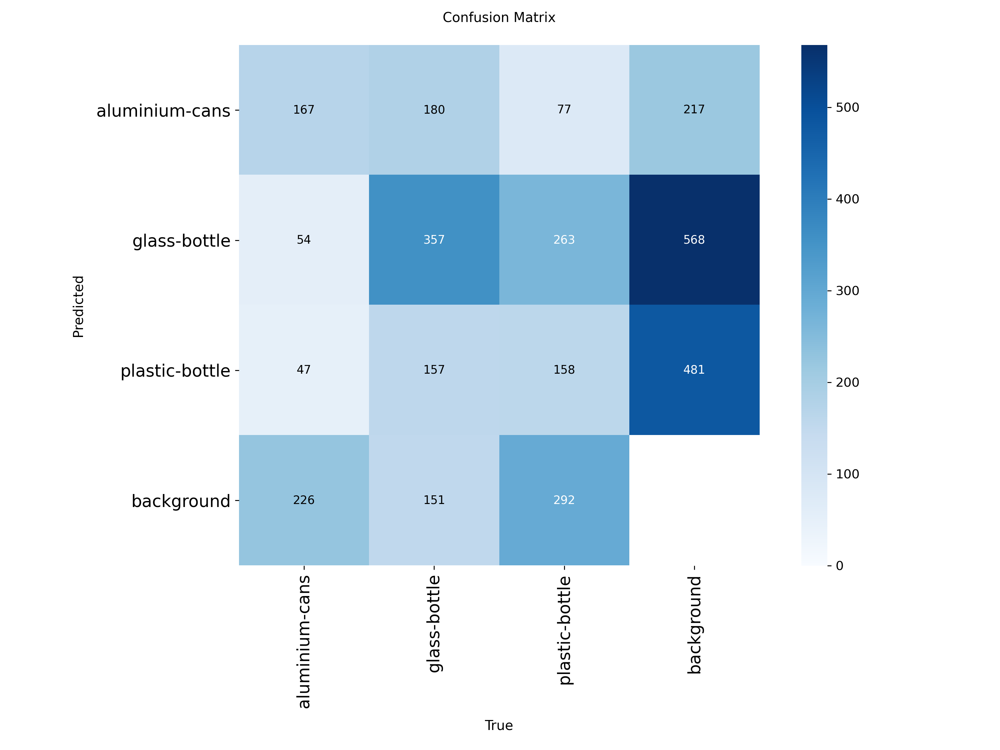

In [15]:
# Display an image (local file)
display(Image(filename=f'{detect_path}/confusion_matrix.png'))

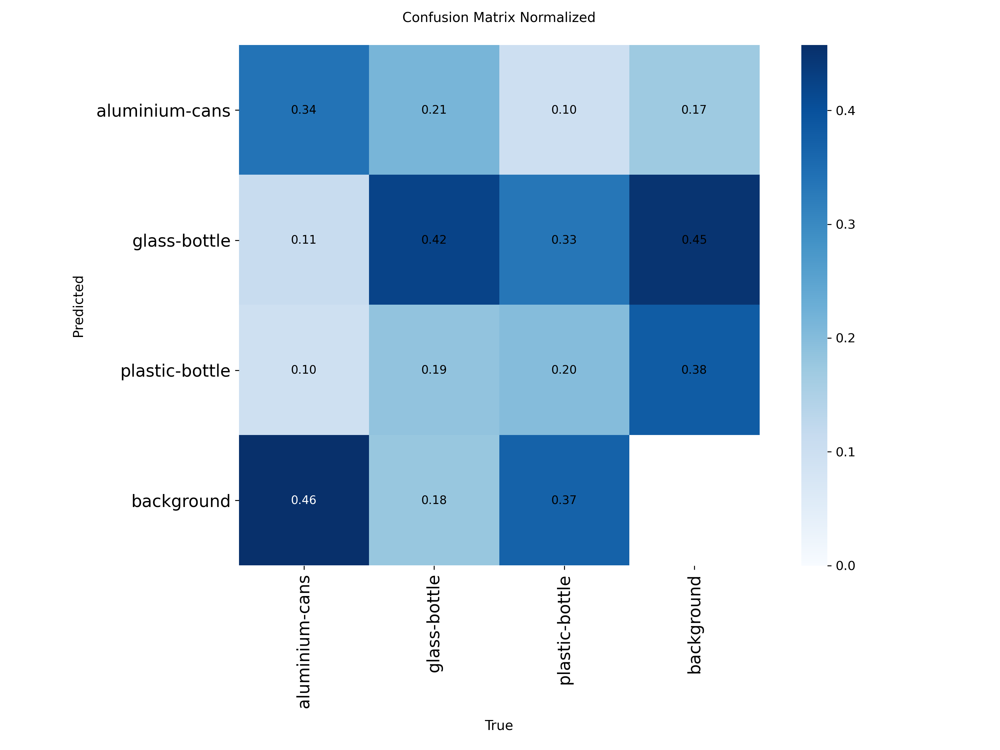

In [17]:
display(Image(filename=f'{detect_path}/confusion_matrix_normalized.png'))

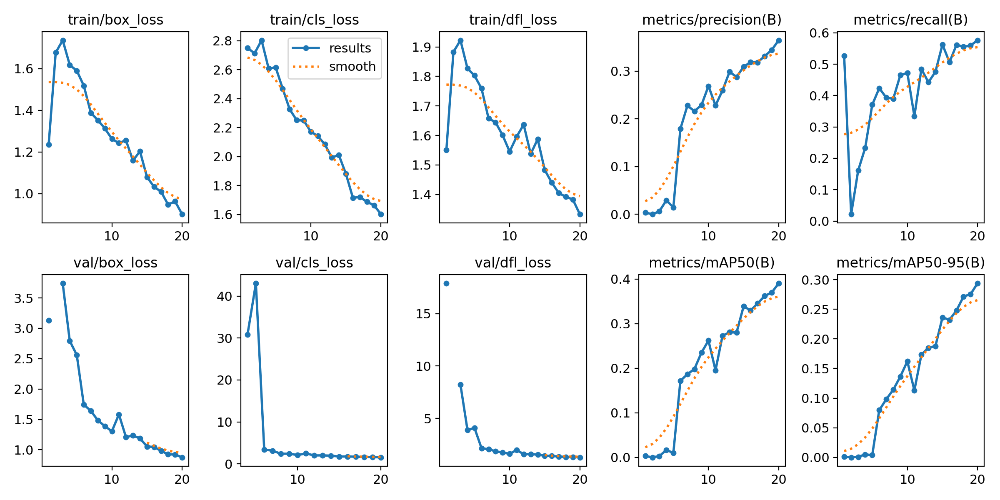

In [16]:
display(Image(filename=f'{detect_path}/results.png'))

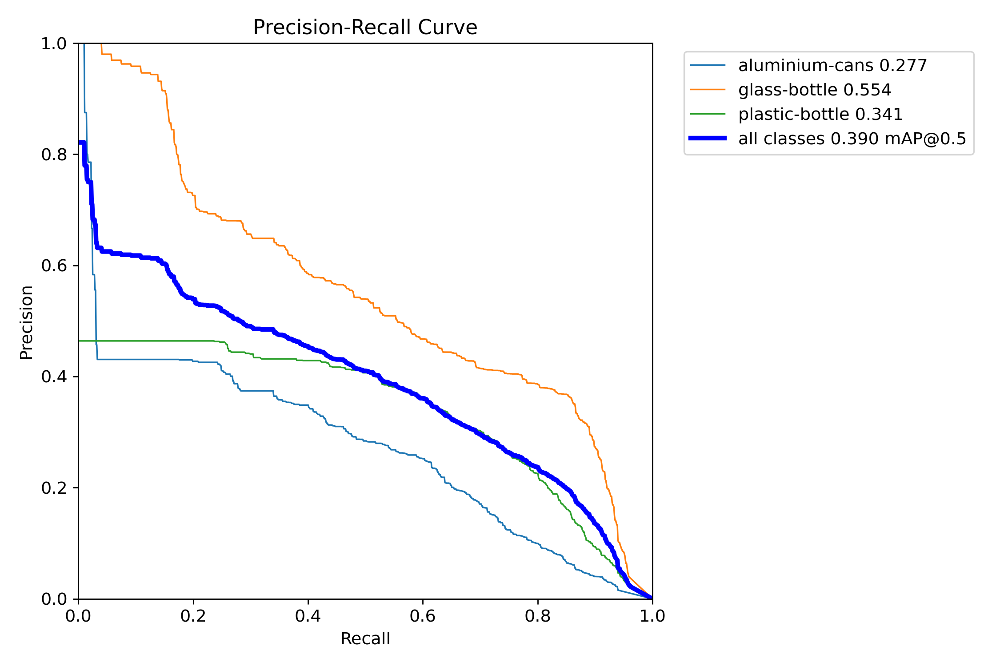

In [18]:
display(Image(filename=f'{detect_path}/PR_curve.png'))

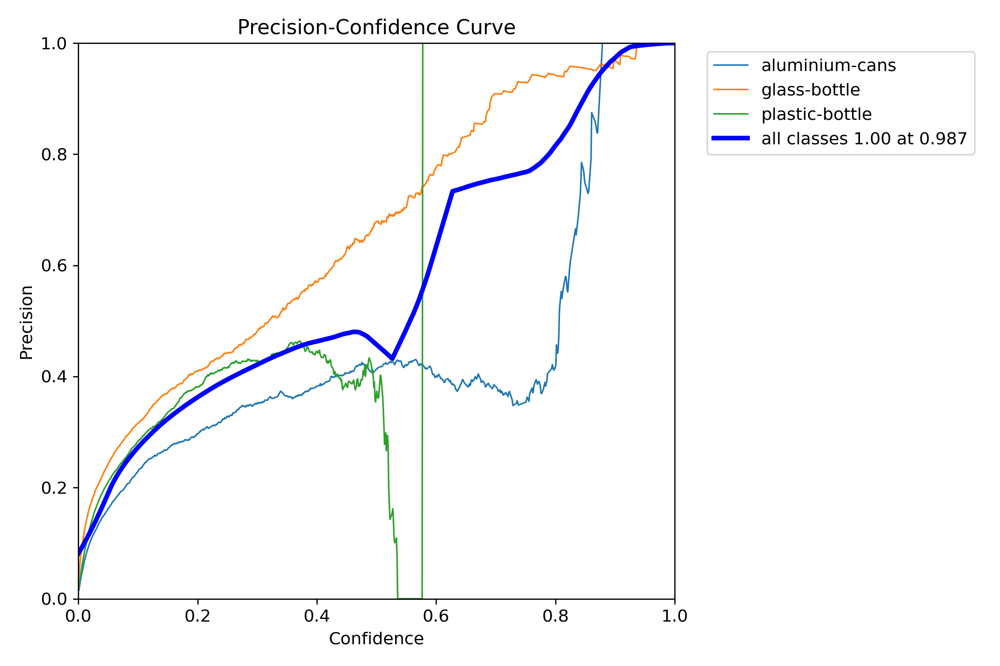

In [19]:
display(Image(filename=f'{detect_path}/P_curve.png'))

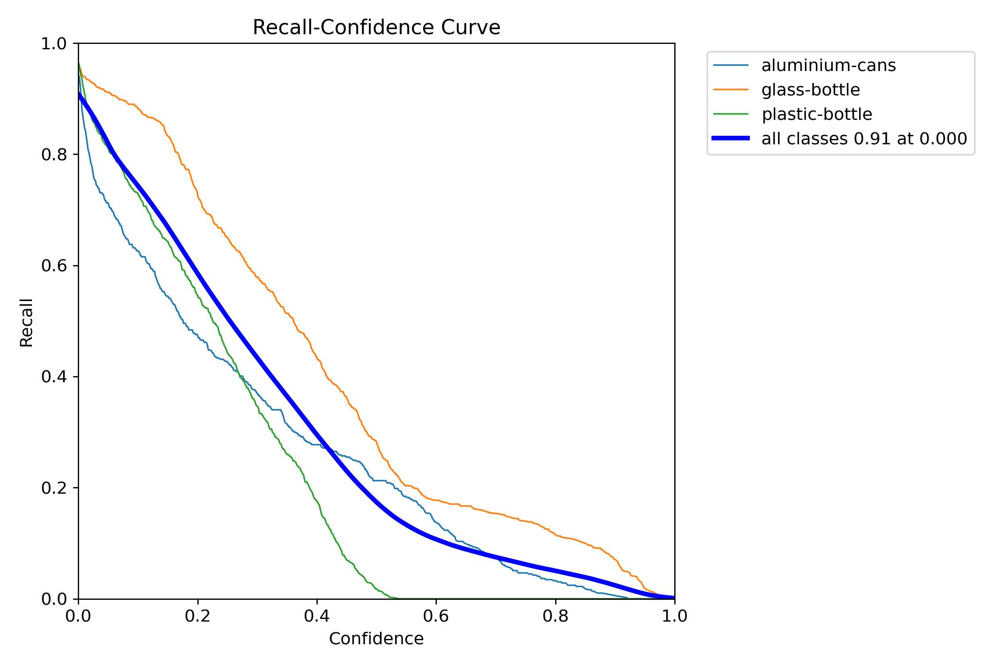

In [20]:
display(Image(filename=f'{detect_path}/R_curve.png'))

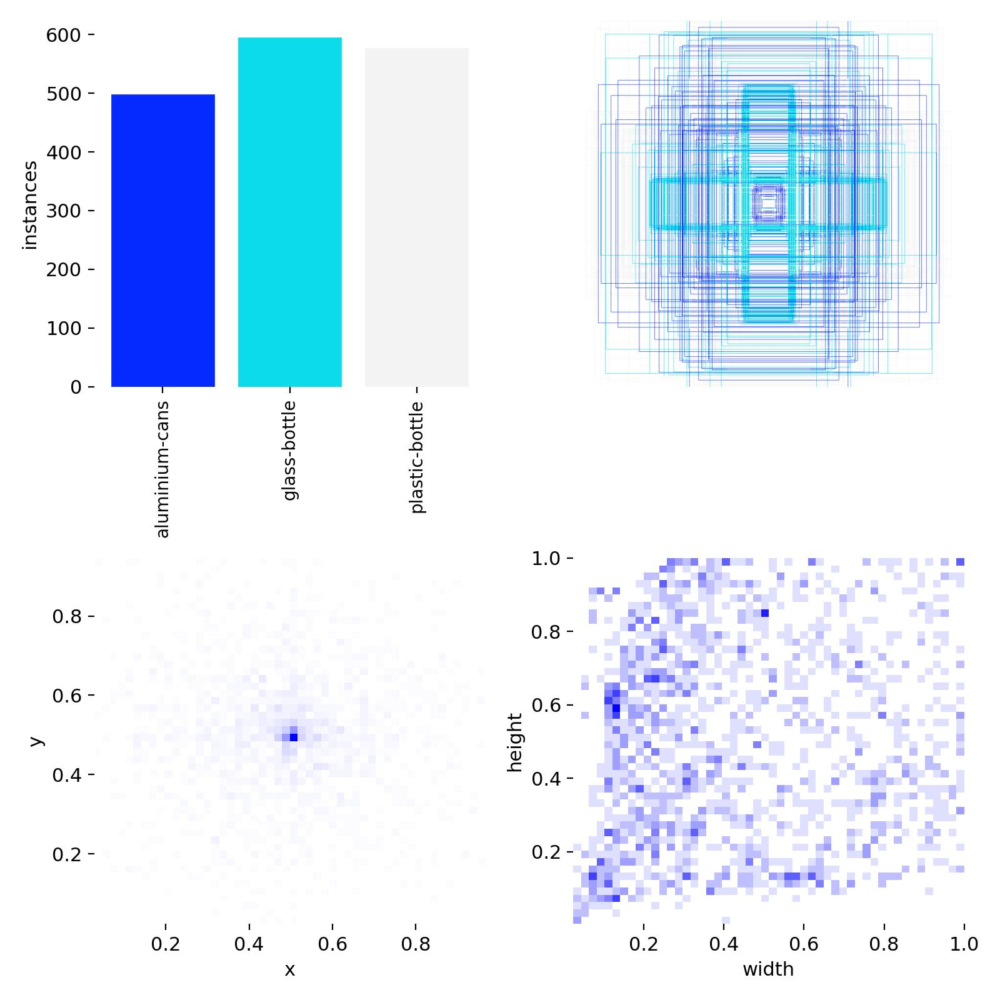

In [21]:
display(Image(filename=f'{detect_path}/labels.jpg'))

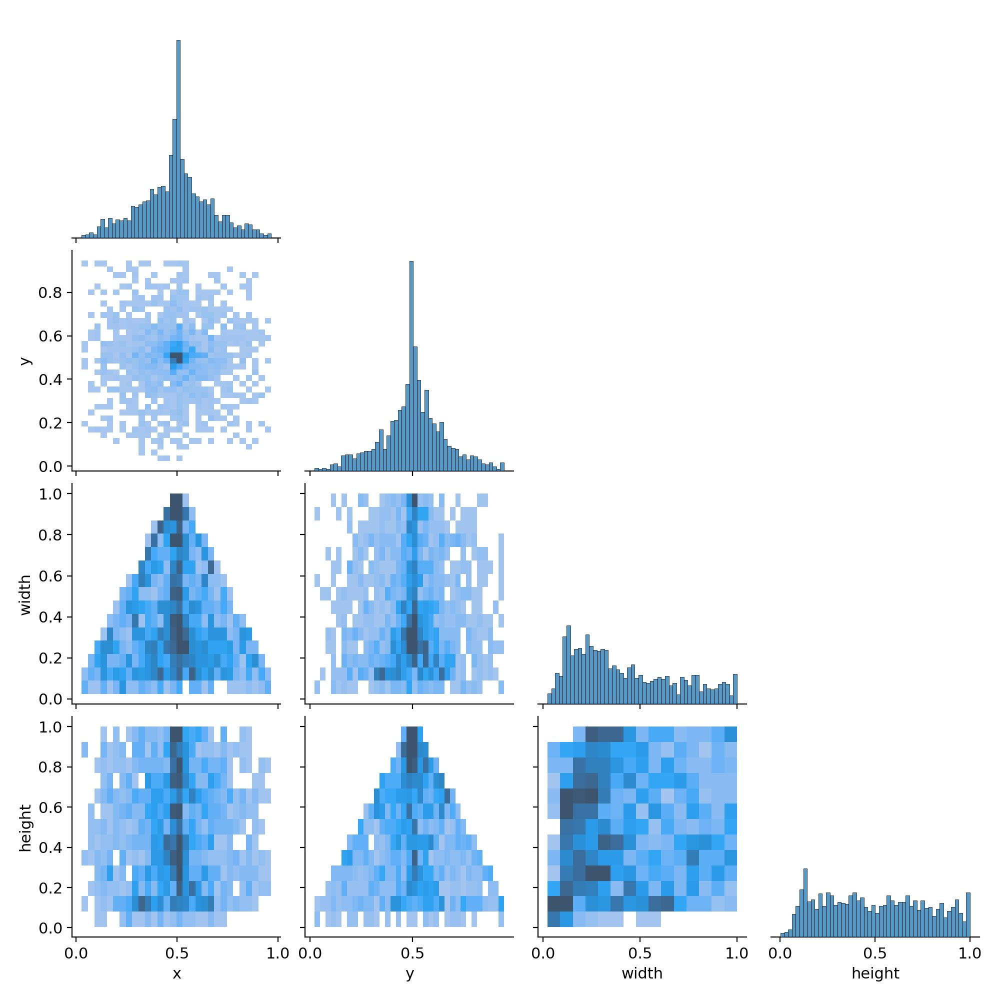

In [23]:
display(Image(filename = f'{detect_path}/labels_correlogram.jpg'))

In [ ]:
display(Image(filename = f'{detect_path}/val_batch0_pred.jpg'))


In [ ]:
display(Image(filename = f'{detect_path}/val_batch0_labels.jpg'))


In [ ]:
display(Image(filename = f'{detect_path}/val_batch1_pred.jpg'))

In [ ]:
display(Image(filename = f'{detect_path}/val_batch1_labels.jpg'))


In [ ]:
display(Image(filename = f'{detect_path}/val_batch2_pred.jpg'))

In [ ]:
display(Image(filename = f'{detect_path}/val_batch2_labels.jpg'))

In [ ]:
display(Image(filename = f'{detect_path}/train_batch_632.jpg'))

## Increasing epochs to 50

In [24]:
!yolo task=detect mode=train data=/kaggle/working/Bottle-and-Can-Detection-v2-1/data.yaml model=yolov8l.pt epochs = 50 imgsz=540 device=0,1

Ultralytics 8.3.161 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Bottle-and-Can-Detection-v2-1/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=540, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, opti

In [25]:
!yolo mode=val task=detect data=/kaggle/working/Bottle-and-Can-Detection-v2-1/data.yaml model=/kaggle/working/runs/detect/train4/weights/best.pt device=0,1

Ultralytics 8.3.161 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 43,608,921 parameters, 0 gradients, 164.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1062.4±523.8 MB/s, size: 29.5 KB)
val: Scanning /kaggle/working/Bottle-and-Can-Detection-v2-1/valid/labels.cache..
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1656, len(boxes) = 2129. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  m
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value

# Validation matrices

In [27]:
model_val_path = "/kaggle/working/runs/detect/val"

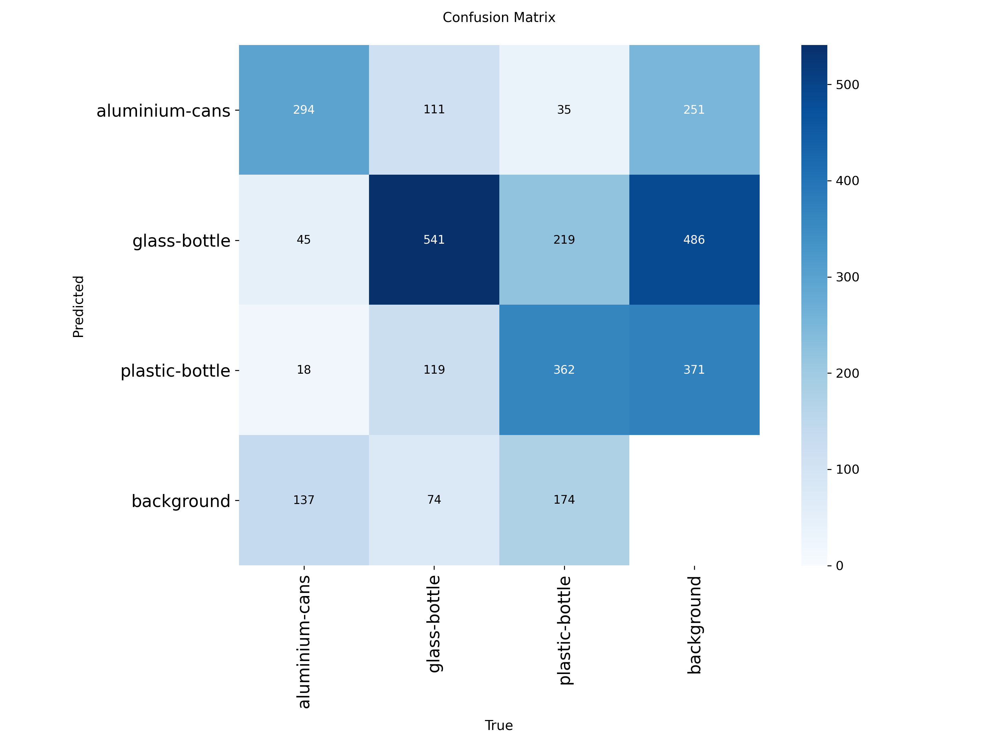

In [30]:
display(Image(filename=f'{model_val_path}/confusion_matrix.png'))

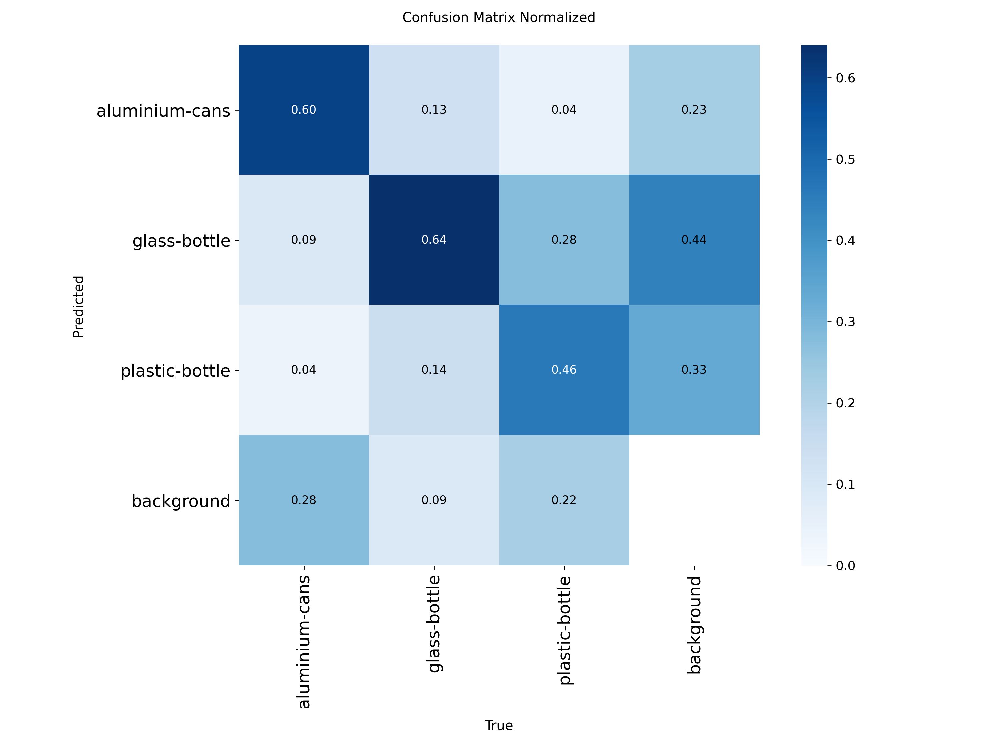

In [35]:
display(Image(filename=f'{model_val_path}/confusion_matrix_normalized.png'))

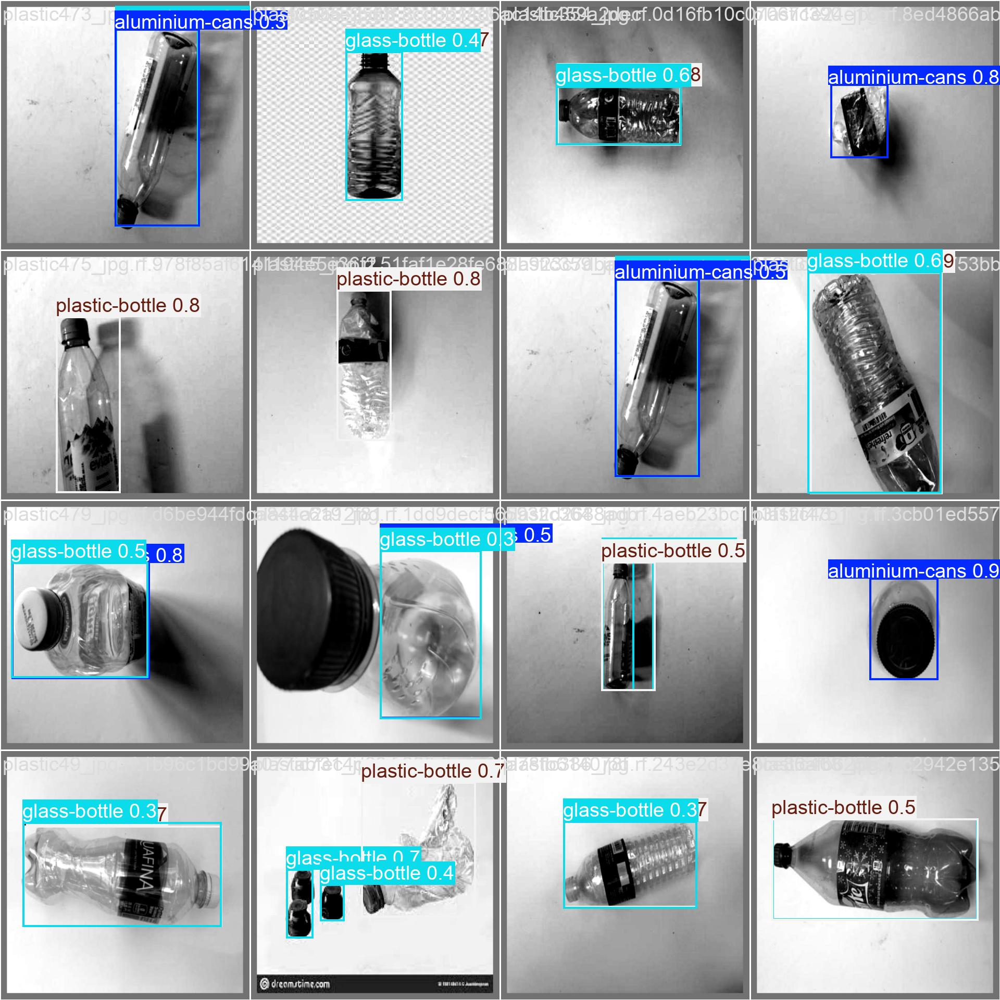

In [31]:
display(Image(filename=f'{model_val_path}/val_batch0_pred.jpg'))

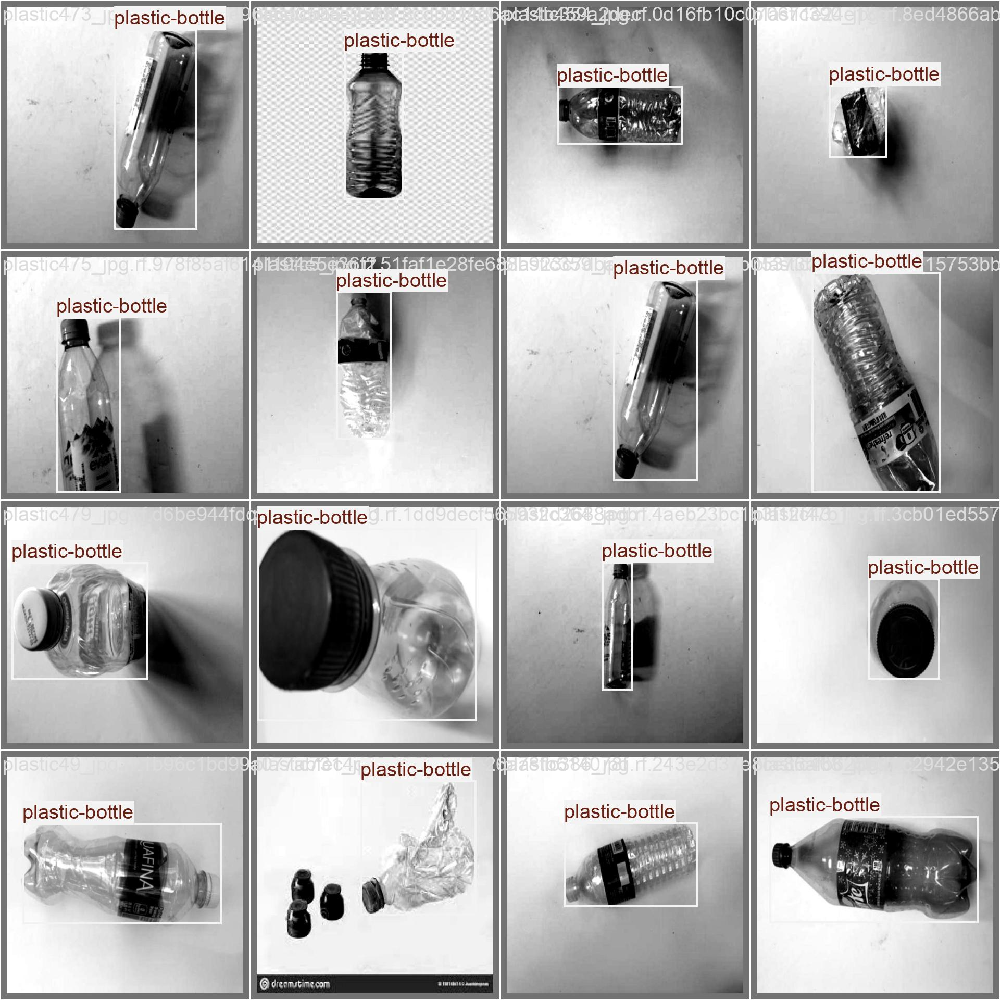

In [32]:
display(Image(filename=f'{model_val_path}/val_batch0_labels.jpg'))

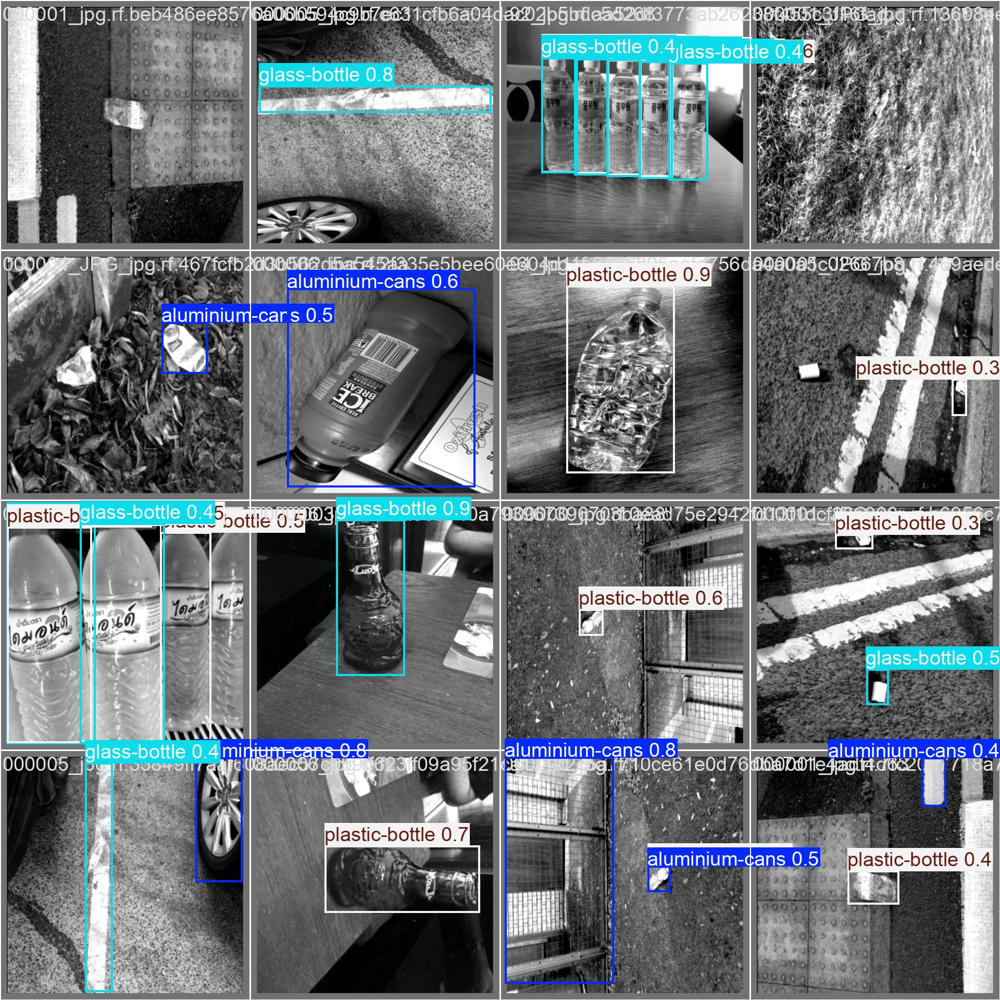

In [33]:
display(Image(filename=f'{model_val_path}/val_batch2_pred.jpg'))

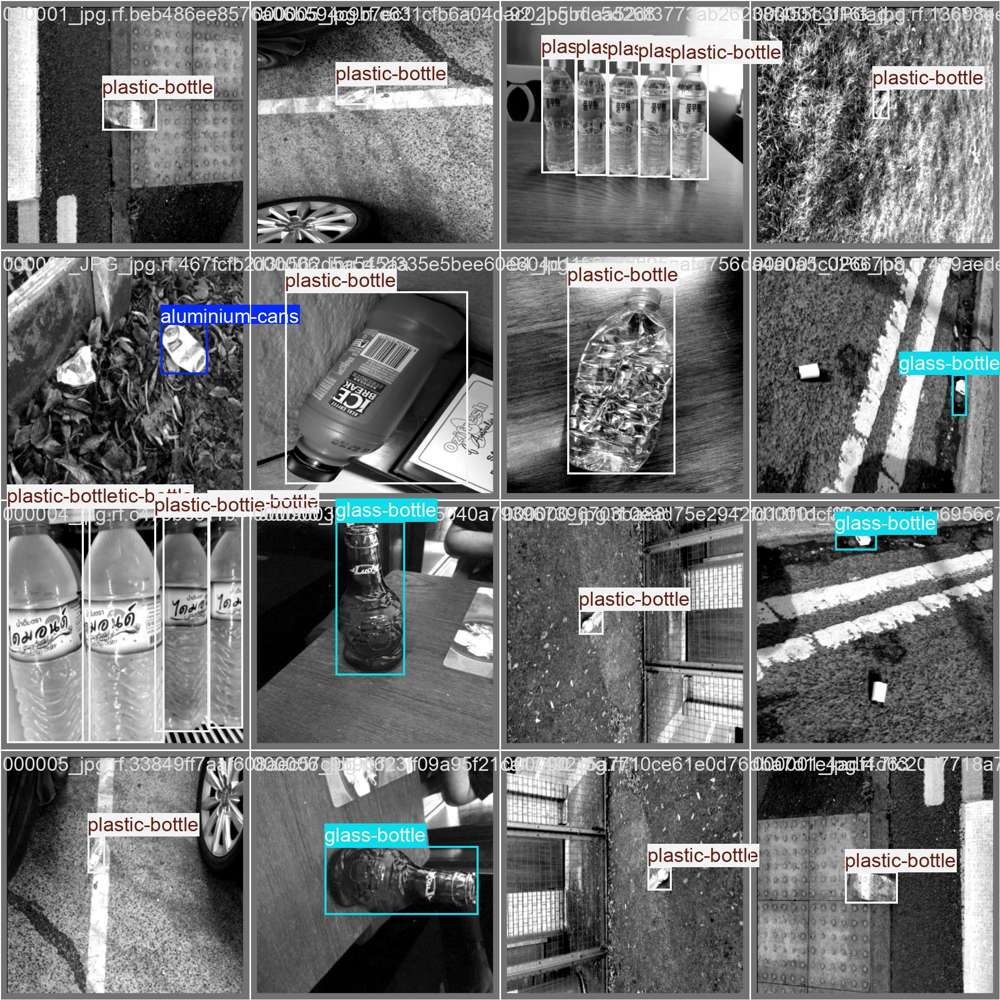

In [34]:
display(Image(filename=f'{model_val_path}/val_batch2_labels.jpg'))

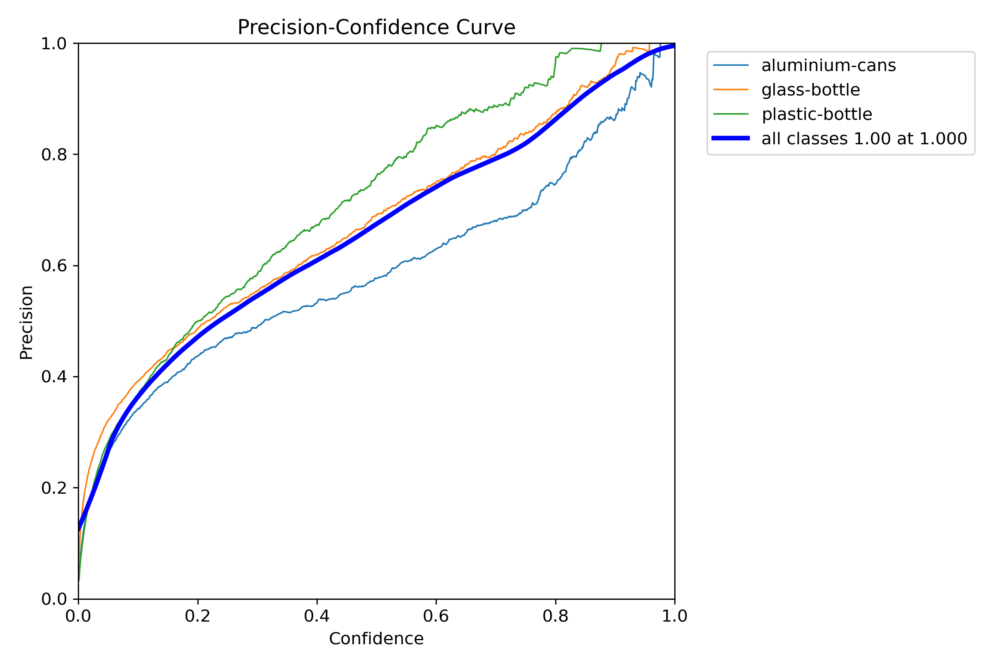

In [36]:
display(Image(filename=f'{model_val_path}/P_curve.png'))

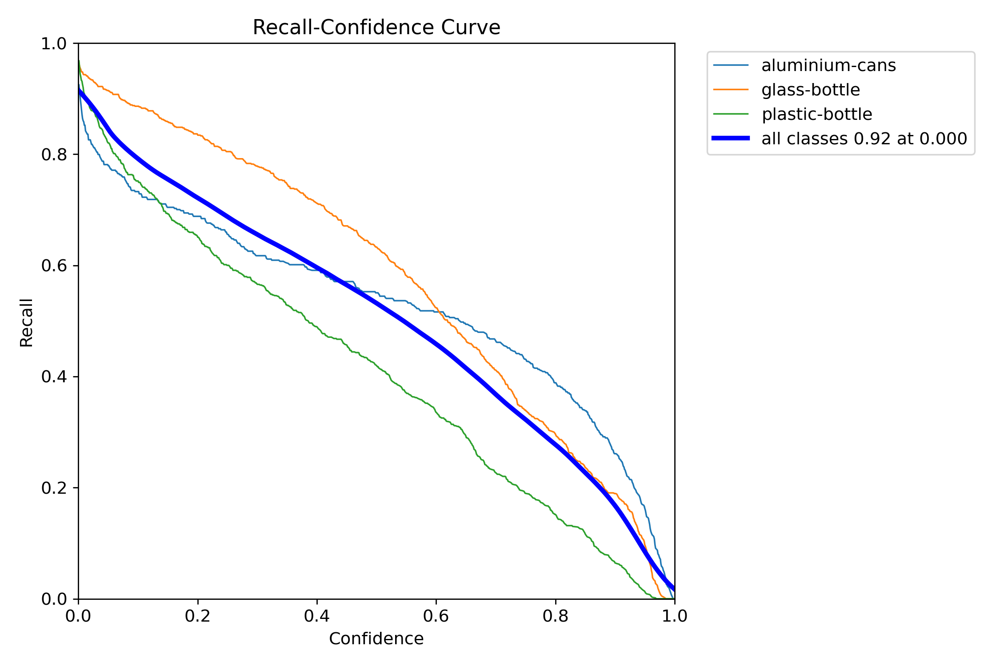

In [37]:
display(Image(filename=f'{model_val_path}/R_curve.png'))

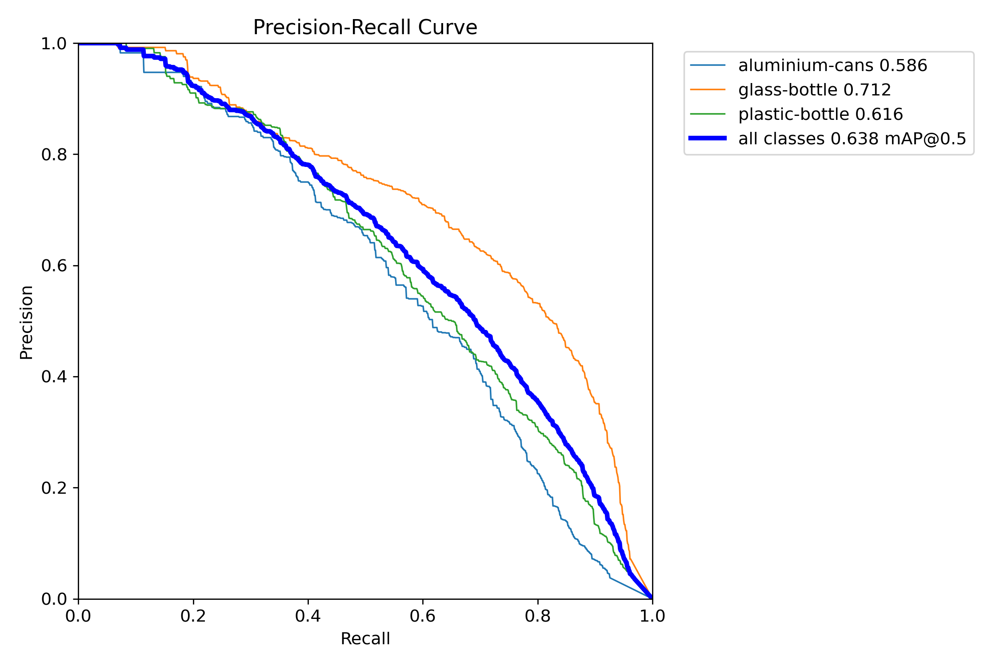

In [38]:
display(Image(filename=f'{model_val_path}/PR_curve.png'))

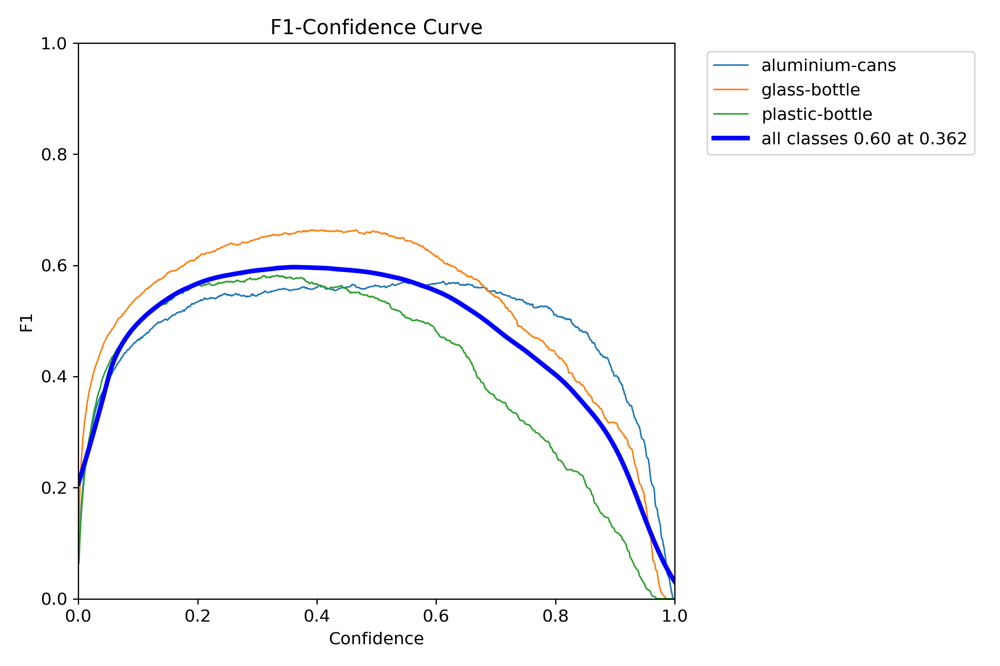

In [39]:
display(Image(filename=f'{model_val_path}/F1_curve.png'))

In [47]:
!yolo detect predict model=/kaggle/working/runs/detect/train4/weights/best.pt source=/kaggle/working/Bottle-and-Can-Detection-v2-1/test/images save=True verbose= False conf=0.65

Ultralytics 8.3.161 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 43,608,921 parameters, 0 gradients, 164.8 GFLOPs
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [48]:
import shutil

shutil.rmtree('/kaggle/working/runs/detect/predict2')


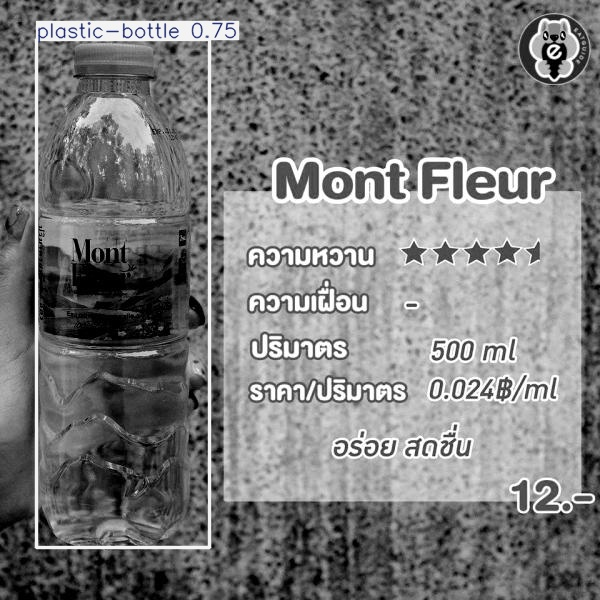

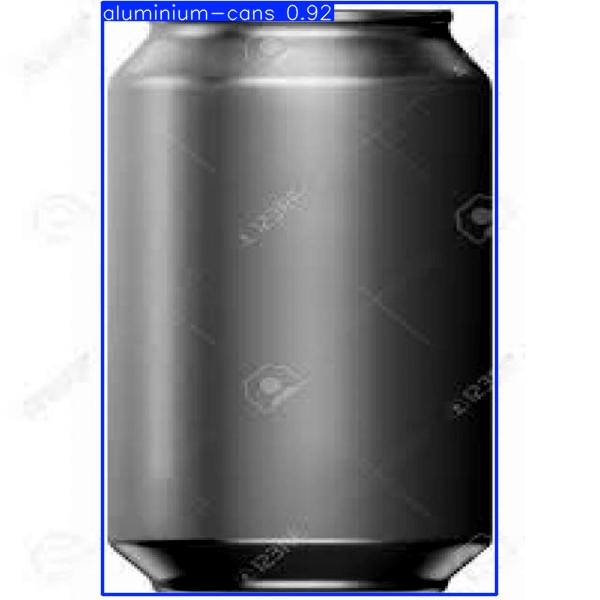

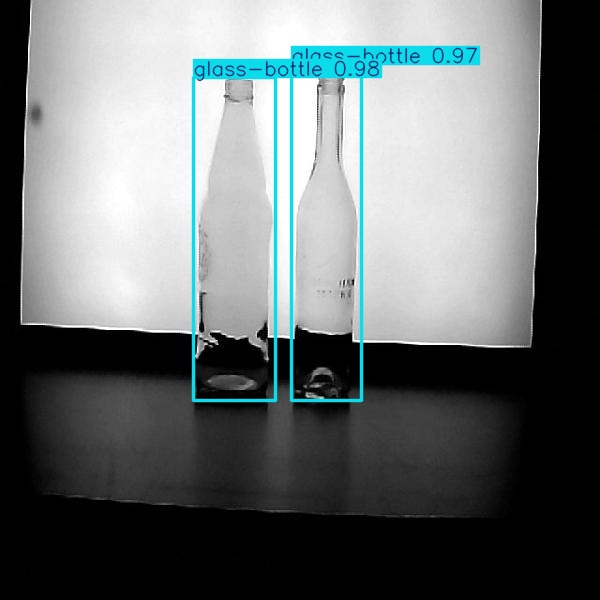

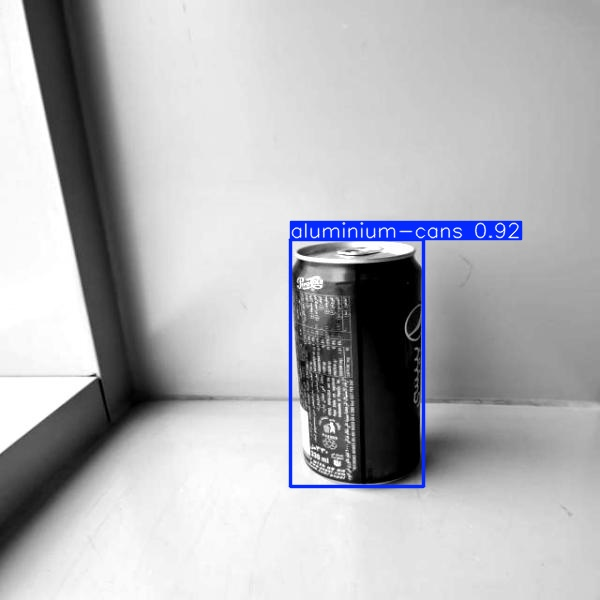

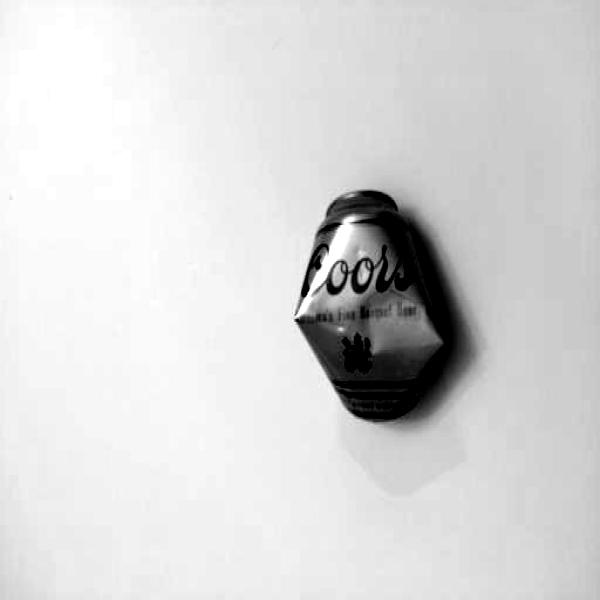

...

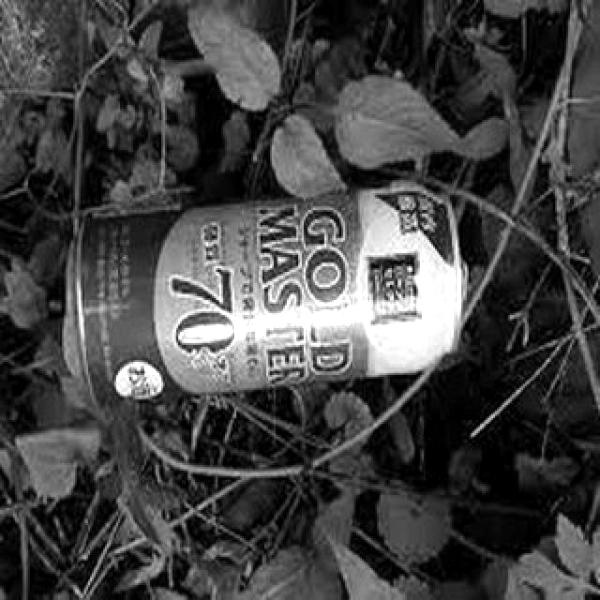

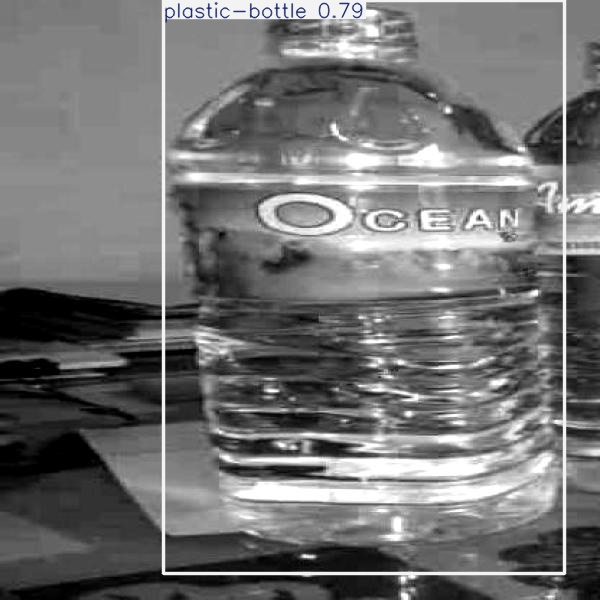

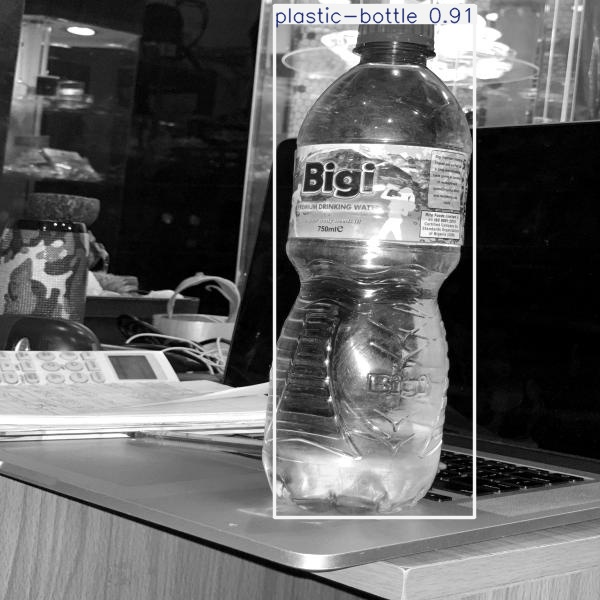

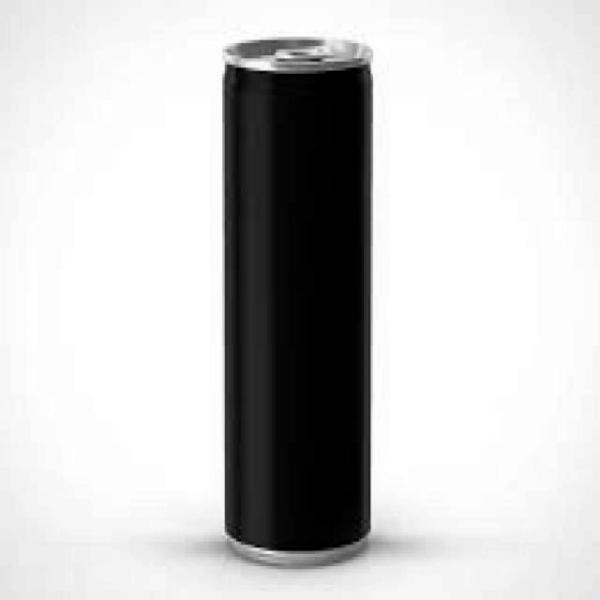

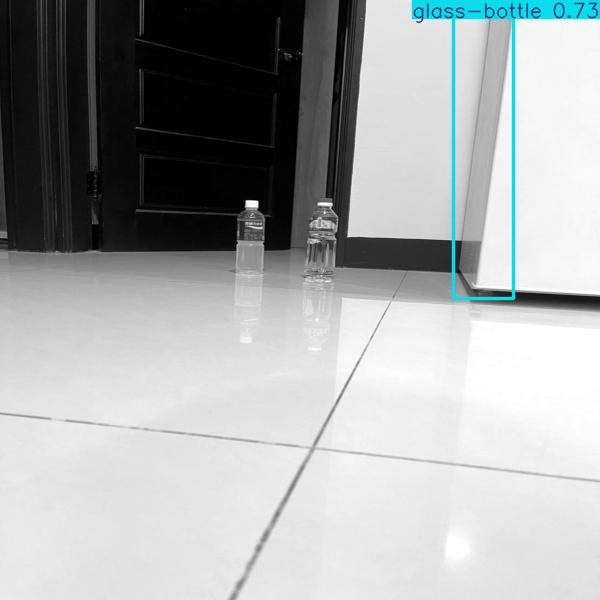

In [49]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/kaggle/working/runs/detect/predict/*.jpg')[:50]:
    display(Image(filename=image_path, height=450))
    print('\n')
